In [ ]:
import numpy as np
import pandas as pd
import random

import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import os

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.optim as optim

from scipy import optimize

from google.colab import drive

In [ ]:
drive.mount('/content/gdrive')

path_dades = "/content/gdrive/MyDrive/Colab Notebooks/postgrau/progecte/propi/dades/data/"

if os.path.exists(path_dades):
    print(f"Directory '{path_dades}' exists.")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Directory '/content/gdrive/MyDrive/Colab Notebooks/postgrau/progecte/propi/dades/data/' exists.


In [ ]:
seed = 42  # Tria qualsevol nombre per la llavor
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)  # Per GPU
torch.cuda.manual_seed_all(seed)  # Si hi ha múltiples GPUs
np.random.seed(seed)
random.seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False  # Pot afectar el rendiment, però millora la reproduïbilitat

In [ ]:
file_train = 'clean_train_data.csv'

file_train = 'data_dilution_or.csv'

data = pd.read_csv(path_dades + file_train, index_col="Time", parse_dates=True)

data.head(2)

,Bearing Pressure (kPa),Power Draw (MW),Speed (RPM),Dilution Flow Rate (m3/h),Conveyor Belt Feed Rate (t/h),Conveyor Belt PSD Fines (%)
Time,,,,,,
2015-09-15 00:00:00,5488.175540,12.037357,7.843532,1030.590108,2935.660276,38.641018
2015-09-15 00:01:00,5423.930126,11.843755,7.681607,1039.869847,2928.333772,45.243656


Data is already **clean** and **time consistent**.

## Data Statistcs

In [ ]:
data.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Bearing Pressure (kPa),138241.0,5361.523864,202.317644,35.651295,5288.403958,5363.159017,5450.906260,5995.657529
Power Draw (MW),138241.0,12.768876,2.710332,-0.073347,12.575926,13.385190,14.078147,16.847413
Speed (RPM),138241.0,8.010549,1.617348,0.000000,8.057497,8.421999,8.677781,8.730035
Dilution Flow Rate (m3/h),138241.0,914.572301,253.076717,0.000000,844.107699,954.845114,1052.036404,1636.474899
Conveyor Belt Feed Rate (t/h),138241.0,2397.461253,667.784258,0.000000,2214.845016,2595.094886,2816.978574,3594.124010
Conveyor Belt PSD Fines (%),138241.0,39.530806,9.964693,0.000000,36.440289,41.042423,44.861343,84.740463


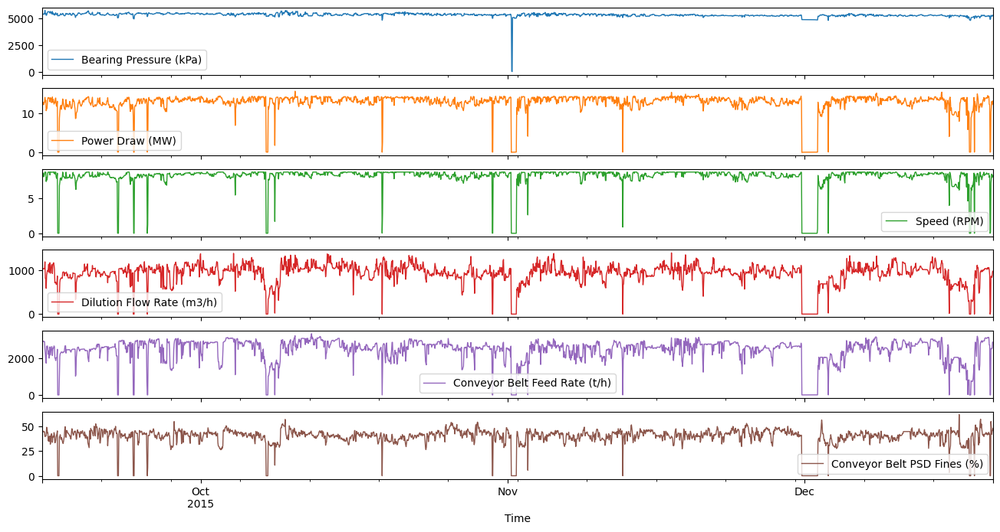

In [ ]:
# median by hours, training data
data.resample("h").median().plot(subplots=True, layout=(-1, 1), lw=1, figsize=(16, 8))
plt.show()

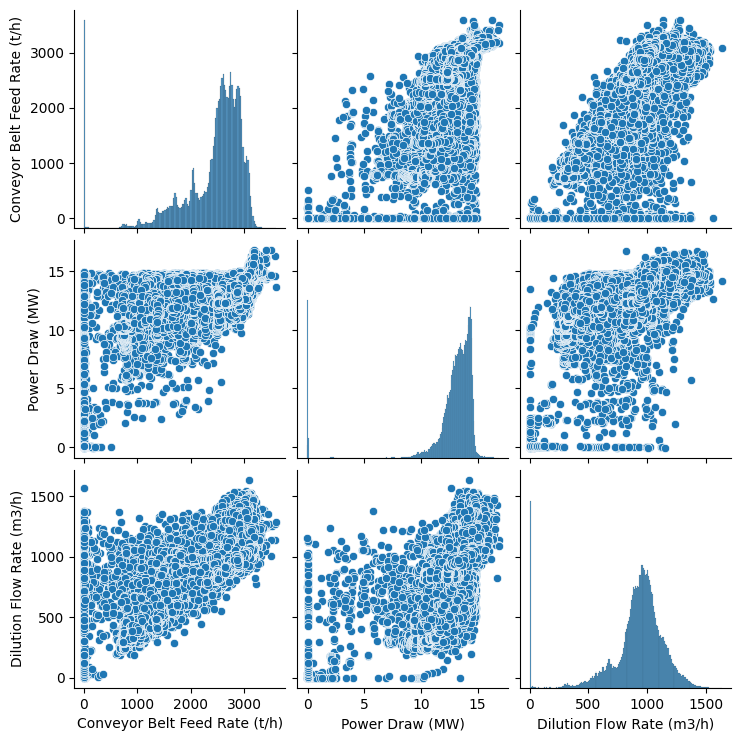

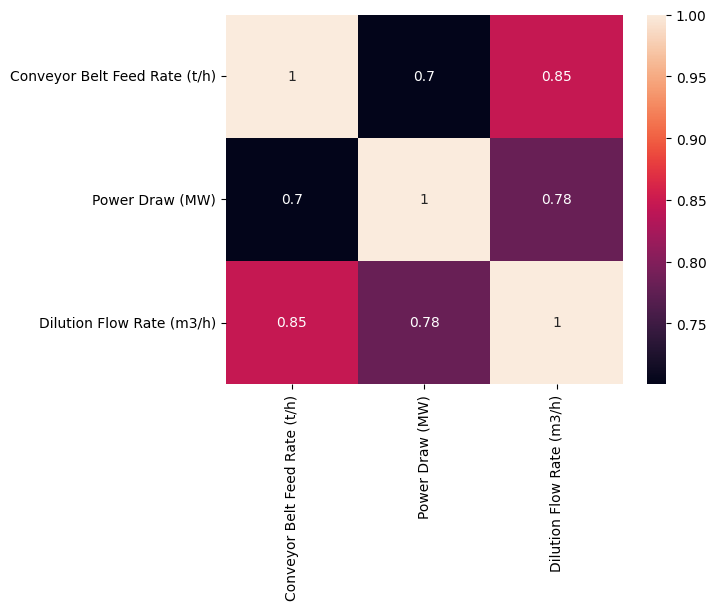

In [ ]:
data_int = data[['Conveyor Belt Feed Rate (t/h)', 'Power Draw (MW)', 'Dilution Flow Rate (m3/h)']]
sns.pairplot(data_int)
plt.show()

# Correlation matrix
corr_matrix = data_int.corr()
sns.heatmap(corr_matrix, annot=True)
plt.show()

In [ ]:
fig = px.histogram(data, x='Conveyor Belt Feed Rate (t/h)', nbins=200, title='Histogram of Conveyor Belt Feed Rate (t/h)')

fig.update_layout(
    xaxis_title='Conveyor Belt Feed Rate (t/h)',
    yaxis_title='Number of Occurrences',
    bargap=0,  # Gap between bars
    template='plotly_white'  # Template for the plot style
)

# Show the plot
fig.show()

In [ ]:
fig = px.histogram(data, x='Dilution Flow Rate (m3/h)', nbins=200, title='Histogram of Dilution Flow Rate (m3/h)')

fig.update_layout(
    xaxis_title='Dilution Flow Rate (m3/h)',
    yaxis_title='Number of Occurrences',
    bargap=0,  # Gap between bars
    template='plotly_white'  # Template for the plot style
)

# Show the plot
fig.show()

In [ ]:
filtered_df = data[data['Conveyor Belt Feed Rate (t/h)'] > 500]

# Bin the data
bins = np.linspace(filtered_df['Conveyor Belt Feed Rate (t/h)'].min(), filtered_df['Conveyor Belt Feed Rate (t/h)'].max(), 100)
filtered_df['binned'] = np.digitize(filtered_df['Conveyor Belt Feed Rate (t/h)'], bins)

# Aggregate the data
agg_df = filtered_df.groupby('binned').agg({
    'Conveyor Belt Feed Rate (t/h)': 'mean',
    'Power Draw (MW)': 'mean',
    'Dilution Flow Rate (m3/h)': 'mean'  # Adding the third variable
}).reset_index()

# Create an interactive 3D scatter plot
fig = px.scatter_3d(
    agg_df,
    x='Conveyor Belt Feed Rate (t/h)',
    z='Power Draw (MW)',
    y='Dilution Flow Rate (m3/h)',
    color='Dilution Flow Rate (m3/h)',
    labels={
        'Conveyor Belt Feed Rate (t/h)': 'Conveyor Belt Feed Rate (t/h)',
        'Power Draw (MW)': 'Power Draw (MW)',
        'Dilution Flow Rate (m3/h)': 'Dilution Flow Rate (m3/h)'
    },
    title='Aggregated Conveyor Belt Feed Rate vs Power Draw vs Dilution Flow Rate (Filtered Data)',
    color_continuous_scale='Viridis'
)

# Show the plot
fig.show()

<ipython-input-10-08222ace50be>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
# Select rows  where in column Conveyor Belt Feed Rate (t/h) value is 2590-2610
filtered_df = data[(data['Conveyor Belt Feed Rate (t/h)'] >= 2590) & (data['Conveyor Belt Feed Rate (t/h)'] <= 2610)]
print(len(filtered_df))
# Bin the data
bins = np.linspace(filtered_df['Conveyor Belt Feed Rate (t/h)'].min(), filtered_df['Conveyor Belt Feed Rate (t/h)'].max(), 300)
filtered_df['binned'] = np.digitize(filtered_df['Conveyor Belt Feed Rate (t/h)'], bins)

# Aggregate the data
agg_df = filtered_df.groupby('binned').agg({
    'Conveyor Belt Feed Rate (t/h)': 'mean',
    'Power Draw (MW)': 'mean',
    'Dilution Flow Rate (m3/h)': 'mean'  # Adding the third variable
}).reset_index()

# Create an interactive 3D scatter plot
fig = px.scatter_3d(
    agg_df,
    y='Conveyor Belt Feed Rate (t/h)',
    z='Power Draw (MW)',
    x='Dilution Flow Rate (m3/h)',
    color='Dilution Flow Rate (m3/h)',
    labels={
        'Conveyor Belt Feed Rate (t/h)': 'Conveyor Belt Feed Rate (t/h)',
        'Power Draw (MW)': 'Power Draw (MW)',
        'Dilution Flow Rate (m3/h)': 'Dilution Flow Rate (m3/h)'
    },
    title='Aggregated Conveyor Belt Feed Rate vs Power Draw vs Dilution Flow Rate (Filtered Data)',
    color_continuous_scale='Viridis'
)

# Show the plot
fig.show()

<ipython-input-11-a89c145608b6>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



3456


## Split data and convert it into tensors:

In [ ]:
# Assuming the features are in columns ['Bearing Pressure (kPa)', 'Speed (RPM)', 'Dilution Flow Rate (m3/h)', 'Conveyor Belt PSD Fines (%)']
# and targets are 'Conveyor Belt Feed Rate (t/h)' and 'Power Draw (MW)'
X = data[['Conveyor Belt Feed Rate (t/h)', 'Dilution Flow Rate (m3/h)']]
y = data[[ 'Power Draw (MW)']]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


x_mean = X_train.mean()
x_std = X_train.std()
y_mean = y_train.mean()
y_std = y_train.std()

# Apply it to our data ((data - mean)/std)
X_train = (X_train - x_mean) / x_std
y_train = (y_train - y_mean) / y_std

# per entrenar el model les dates
#del test no les normalitzem
X_test = (X_test - x_mean) / x_std
y_test = (y_test - y_mean) / y_std

# Convert data to PyTorch tensors
X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32)

In [ ]:
X_train_tensor

tensor([[-0.2363,  0.1364],
        [-1.3827, -0.8678],
        [-3.5880, -3.6132],
        ...,
        [-0.0531, -0.0269],
        [-3.5880, -3.6132],
        [ 0.1157, -0.2650]])

In [ ]:
X_test_tensor

tensor([[-3.5880, -3.6132],
        [-0.9780, -1.2361],
        [ 0.8989,  0.9690],
        ...,
        [ 0.2403, -0.1559],
        [ 0.4005, -0.0442],
        [ 0.1517, -0.3563]])

## Building the NN

In [ ]:
class MultiOutputNN(nn.Module):
    def __init__(self):
        super(MultiOutputNN, self).__init__()
        self.fc1 = nn.Linear(2, 64)
        self.fc2 = nn.Linear(64, 64)
        self.fc3 = nn.Linear(64, 1)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = torch.relu(self.fc2(x))
        x = self.fc3(x)
        return x

# Create model instance
model = MultiOutputNN()

In [ ]:
# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.0005)

# Define tolerance for accuracy
tolerance = 0.1
# Train the model
num_epochs = 1000
train_losses = []
test_losses = []
train_accuracies = []
test_accuracies = []

for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    outputs = model(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()
    train_losses.append(loss.item())

    # Calculate train accuracy
    train_accuracy = torch.mean((torch.abs(outputs - y_train_tensor) < tolerance).float()).item()
    train_accuracies.append(train_accuracy)

    # Evaluate on test data
    model.eval()
    with torch.no_grad():
        y_test_pred_tensor = model(X_test_tensor)
        test_loss = criterion(y_test_pred_tensor, y_test_tensor)
        test_losses.append(test_loss.item())

        # Calculate test accuracy
        test_accuracy = torch.mean((torch.abs(y_test_pred_tensor - y_test_tensor) < tolerance).float()).item()
        test_accuracies.append(test_accuracy)

    if (epoch + 1) % 10 == 0:
        print(f'Epoch [{epoch + 1}/{num_epochs}], Train Loss: {loss.item():.4f}, Test Loss: {test_loss.item():.4f}, Train Accuracy: {train_accuracy:.4f}, Test Accuracy: {test_accuracy:.4f}')

# Final evaluation on the test set
model.eval()
with torch.no_grad():
    y_test_pred_tensor = model(X_test_tensor)
    y_test_pred = y_test_pred_tensor.numpy()

mse = mean_squared_error(y_test, y_test_pred, multioutput='raw_values')
print(f'Mean Squared Error: Power Draw: {mse[0]}')

Epoch [10/1000], Train Loss: 0.5980, Test Loss: 0.5729, Train Accuracy: 0.1774, Test Accuracy: 0.1778
Epoch [20/1000], Train Loss: 0.4503, Test Loss: 0.4332, Train Accuracy: 0.1956, Test Accuracy: 0.1953
Epoch [30/1000], Train Loss: 0.3639, Test Loss: 0.3543, Train Accuracy: 0.2137, Test Accuracy: 0.2154
Epoch [40/1000], Train Loss: 0.3186, Test Loss: 0.3123, Train Accuracy: 0.2305, Test Accuracy: 0.2289
Epoch [50/1000], Train Loss: 0.2863, Test Loss: 0.2812, Train Accuracy: 0.2433, Test Accuracy: 0.2437
Epoch [60/1000], Train Loss: 0.2594, Test Loss: 0.2553, Train Accuracy: 0.2525, Test Accuracy: 0.2562
Epoch [70/1000], Train Loss: 0.2362, Test Loss: 0.2326, Train Accuracy: 0.2596, Test Accuracy: 0.2628
Epoch [80/1000], Train Loss: 0.2170, Test Loss: 0.2142, Train Accuracy: 0.2650, Test Accuracy: 0.2695
Epoch [90/1000], Train Loss: 0.2005, Test Loss: 0.1983, Train Accuracy: 0.2714, Test Accuracy: 0.2731
Epoch [100/1000], Train Loss: 0.1864, Test Loss: 0.1848, Train Accuracy: 0.2732, T

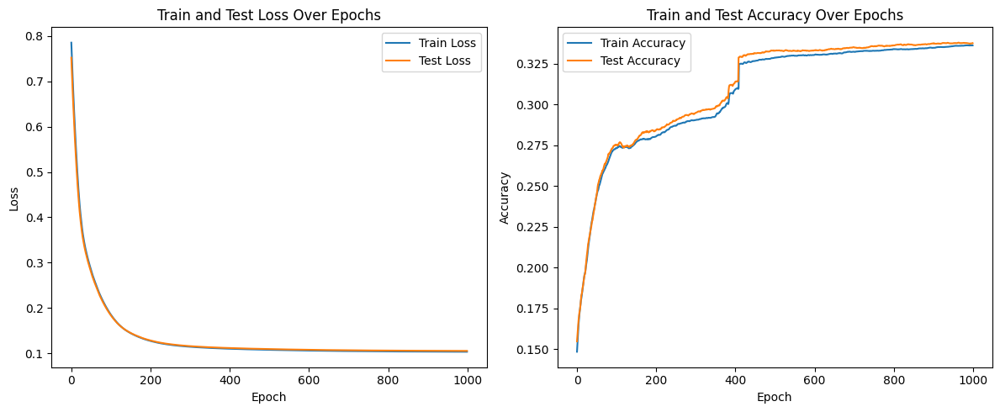

In [ ]:
# Plot train and test loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train and Test Loss Over Epochs')
plt.legend()

# Plot train and test accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(test_accuracies, label='Test Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Train and Test Accuracy Over Epochs')
plt.legend()

plt.tight_layout()
plt.show()

### Feeding the machine with a feed rate larger than 3300 can cause damage to the machinery; therefore, the limit for the feed rate is 3300.

In [ ]:
count_greater_than_3000 = data[data['Conveyor Belt Feed Rate (t/h)'] > 3000].shape[0]
count_greater_than_3300 = data[data['Conveyor Belt Feed Rate (t/h)'] > 3300].shape[0]
print('count_greater_than_3000',count_greater_than_3000)
print('count_greater_than_3300',count_greater_than_3300)

count_greater_than_3000 9857
count_greater_than_3300 58


# Optimization

## a) Objective function

In [ ]:
def inferencing(X): # (X_test_tensor, x_mean, x_std, y_std, y_mean, model)
  x_n = (X - x_mean) / x_std
  x_n_t = torch.tensor(x_n, dtype=torch.float32)
  #print('x_n_t', x_n_t)
  model.eval()
  with torch.inference_mode():
    y_preds = model(x_n_t)
    y_p_original = y_preds.detach().numpy()  * y_std + y_mean
    #print('y_p_original', y_p_original)
  return y_p_original

In [ ]:
def objective(X): # (X_test_tensor, x_mean, x_std, y_std, y_mean, model)
  x_n = (X - x_mean) / x_std
  x_n_t = torch.tensor(x_n, dtype=torch.float32)

  model.eval()
  with torch.inference_mode():
    y_preds = model(x_n_t)
    y_p_original = y_preds.detach().numpy()  * y_std + y_mean
  return  -X/y_p_original

In [ ]:
X = 3050, 900
y_p = inferencing(X)
print(y_p)

Power Draw (MW)    12.999109
dtype: float64


<ipython-input-19-99ef143ab2a0>:3: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



In [ ]:
import itertools

feed_range = np.linspace(1000, 3350, 250)
dilution_flow_range = np.linspace(200, 1500, 250)

range = [list(pair) for pair in itertools.product(feed_range, dilution_flow_range)]

print(len(range))
print(range[0])

62500
[1000.0, 200.0]


In [ ]:
# create dataset with predicted data
feed_rates = []
dilution_rates = []
power_draws_predicted = []

for x in range:
    feed_rates.append(x[0])
    dilution_rates.append(x[1])
    power_draws_predicted.append(inferencing(x)[0])

predicted_df = pd.DataFrame({
    'conveyor_belt_feed_rate': feed_rates,
    'dilution_low_rate': dilution_rates,
    'power_draw_pred': power_draws_predicted
})

#predicted_df.head()
predicted_df.iloc[197:202]

<ipython-input-19-99ef143ab2a0>:3: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

<ipython-input-23-2dc1856ffe07>:9: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



,conveyor_belt_feed_rate,dilution_low_rate,power_draw_pred
197,1000.0,1228.514056,13.111344
198,1000.0,1233.734940,13.098523
199,1000.0,1238.955823,13.085702
200,1000.0,1244.176707,13.072881
201,1000.0,1249.397590,13.060060


## Graph using the **NN and the objective function** to predict **y** (Power Draw (MW)) using **x** (Conveyor Belt Feed Rate (t/h), Dilution Flow Rate (m3/h)).

In [ ]:
# Sort the dataframe
sorted_predicted_df = predicted_df.sort_values(['conveyor_belt_feed_rate', 'dilution_low_rate'])

# find the dilution flow rate that minimizes power draw
min_points = sorted_predicted_df.loc[sorted_predicted_df.groupby('conveyor_belt_feed_rate')['power_draw_pred'].idxmin()]

In [ ]:

# Create a 3D scatter plot for all points
fig = px.scatter_3d(
    sorted_predicted_df,  # Use sorted dataframe here
    x='dilution_low_rate',
    y='conveyor_belt_feed_rate',
    z='power_draw_pred',
    color='power_draw_pred',
    labels={
        'conveyor_belt_feed_rate': 'Conveyor Belt Feed Rate (t/h)',
        'power_draw_pred': 'Power Draw (MW)',
        'dilution_low_rate': 'Dilution Flow Rate (m3/h)'
    },
    title='Power Draw Surface with Local Minimum Path',
    color_continuous_scale='Viridis'
)

# Reduce marker size for the first plot (scatter points)
fig.update_traces(marker=dict(size=1))

# Add a line connecting the minimum points with larger markers
fig.add_trace(go.Scatter3d(
    x=min_points['dilution_low_rate'],
    y=min_points['conveyor_belt_feed_rate'] ,
    z=min_points['power_draw_pred'],
    mode='lines+markers',
    line=dict(color='red', width=5),
    marker=dict(size=3, color='red'),  # Increase marker size for min points
    name='Local Minimum Path'
))

# Show the plot
fig.show()

In [ ]:
min_points.head()

,conveyor_belt_feed_rate,dilution_low_rate,power_draw_pred
17,1000.000000,288.755020,10.318538
268,1009.437751,293.975904,10.373493
518,1018.875502,293.975904,10.441369
769,1028.313253,299.196787,10.494075
1019,1037.751004,299.196787,10.564199


In [ ]:
# Compute power per unit feed rate
min_points["power_per_unit_feed"] = min_points["power_draw_pred"] / min_points["conveyor_belt_feed_rate"]

# Find the row with the lowest value
min_index = min_points["power_per_unit_feed"].idxmin()
best_row = min_points.loc[min_index]

# Print results
print("Best row with lowest power per unit feed rate:")
print(best_row)

Best row with lowest power per unit feed rate:
conveyor_belt_feed_rate    2991.365462
dilution_low_rate           883.935743
power_draw_pred              12.617584
power_per_unit_feed           0.004218
Name: 52881, dtype: float64


In [ ]:
best_row["conveyor_belt_feed_rate"]

2991.3654618473893

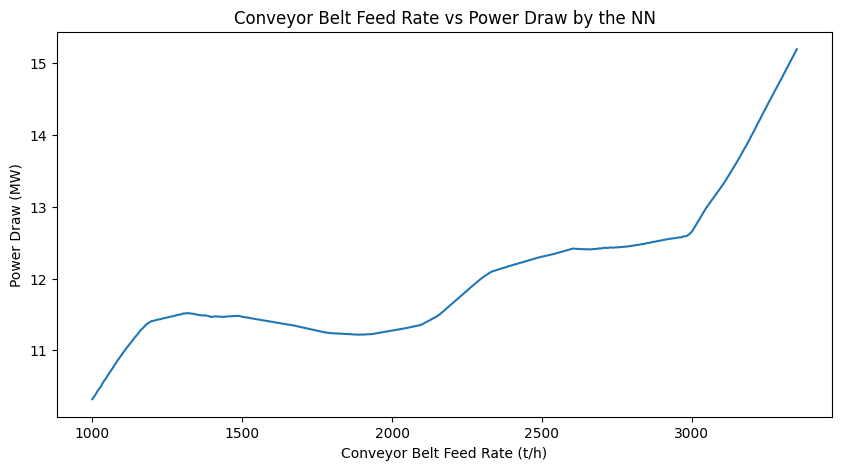

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(min_points["conveyor_belt_feed_rate"], min_points["power_draw_pred"])
plt.xlabel('Conveyor Belt Feed Rate (t/h)')
plt.ylabel('Power Draw (MW)')
plt.title('Conveyor Belt Feed Rate vs Power Draw by the NN')


plt.show()

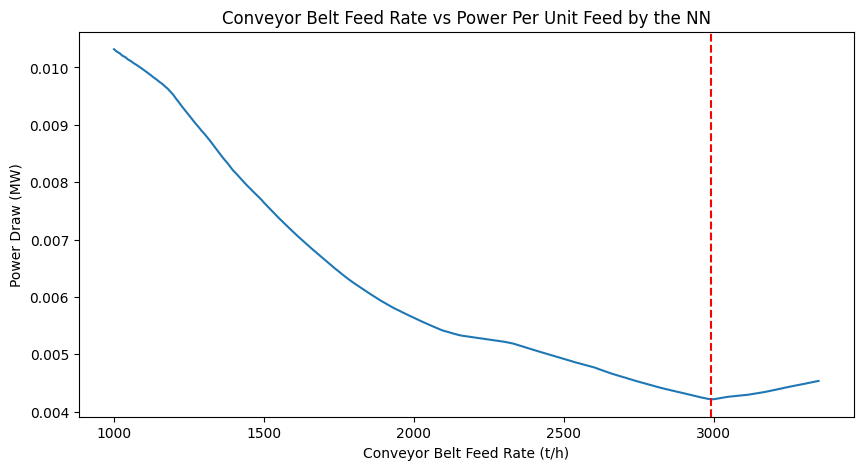

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(min_points["conveyor_belt_feed_rate"], min_points["power_per_unit_feed"])
plt.xlabel('Conveyor Belt Feed Rate (t/h)')
plt.ylabel('Power Draw (MW)')
plt.title('Conveyor Belt Feed Rate vs Power Per Unit Feed by the NN')
plt.axvline(x=best_row["conveyor_belt_feed_rate"], color='r', linestyle='--', label='Feed Rate t/h')

plt.show()

# Median Efficency compared to Optimal Efficency

In [ ]:
actual_efficiency = data['Power Draw (MW)'].sum()/data['Conveyor Belt Feed Rate (t/h)'].sum()
actual_efficiency, best_row['power_per_unit_feed']

(0.005325999099971474, 0.004218001443798341)

In [ ]:
print(f"Optimal conditions compared to the actual efficiency are {actual_efficiency/best_row['power_per_unit_feed']*100 -100}% more efficient.")

Optimal conditions compared to the actual efficiency are 26.26830907803989% more efficient.


Each Ton of material crushed costs 0.0082 MW at the actual efficency and 0.0067 using the proposed parameters. This system offers an improved efficency of 21%.

## Economic Optimicization function

Price of production considering price of energy and fixed costs to run the company. So we are gone a reformulate the objective function for working with energy prices and fixed costs and see if we get a different result.

#### Costs:
- MW/minute: 240Eur.
- Fixed Costs/minute: 500 Eur.

- Price mineral 1.9 EurxT

In [ ]:
min_points["economic_profit"] = 1.9*min_points["conveyor_belt_feed_rate"] -( min_points["power_draw_pred"] * 390 + 400)

In [ ]:
max_index = min_points["economic_profit"].idxmax()
max_profits_row = min_points.loc[max_index]
max_profits_row

,53131
conveyor_belt_feed_rate,3000.803213
dilution_low_rate,883.935743
power_draw_pred,12.658349
power_per_unit_feed,0.004218
economic_profit,364.770048


In [ ]:
max_profits_row["conveyor_belt_feed_rate"], max_profits_row["economic_profit"]

(3000.8032128514055, 364.7700475702095)

In [ ]:
print(f"Use a feed rate of {max_profits_row['conveyor_belt_feed_rate']} and dilution rate of {max_profits_row['dilution_low_rate']} for maximazing profits.")

Use a feed rate of 3000.8032128514055 and dilution rate of 883.9357429718875 for maximazing profits.


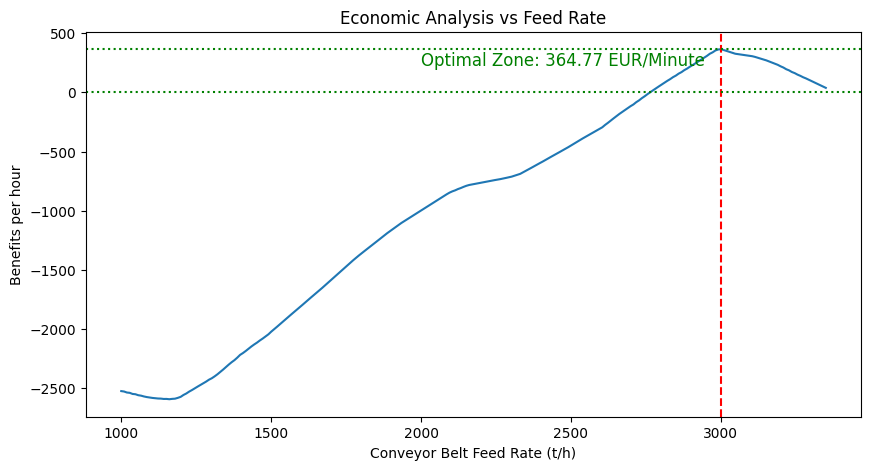

In [ ]:
text_graph = f"Optimal Zone: {max_profits_row['economic_profit']:.2f} EUR/Minute"

plt.figure(figsize=(10, 5))
# Plot the cost values
plt.plot(min_points["conveyor_belt_feed_rate"], min_points["economic_profit"], label='Cost')
# Plot the power draw values
plt.xlabel('Conveyor Belt Feed Rate (t/h)')
plt.ylabel('Benefits per hour') # Adjust the y-axis label
plt.title('Economic Analysis vs Feed Rate')
plt.axvline(x=max_profits_row["conveyor_belt_feed_rate"], color='r', linestyle='--', label='Feed Rate t/h')
plt.axhline(y=0, color='g', linestyle=':', label='Benefit')
plt.axhline(y=max_profits_row["economic_profit"], color='g', linestyle=':', label='Max Profit: 322')
plt.text(2000, 230, text_graph, fontsize=12, color="green")

plt.show()